In [1]:
import os
from os.path import isfile, join

import re

import numpy as np
import pandas as pd
import seaborn as sns

In [2]:
path = '../data/graphs/kw34/results'

def build_df_from_csvs(path: str) -> pd.DataFrame:
    files = os.listdir(path)
    df = pd.DataFrame()

    for current_file in files:
    # current_file = files[0]
        df_tmp = pd.read_csv(join(path, current_file), delimiter=',\t')
        
        prefix = [re.findall(r'(\w+?)(\d+\.\d+|\d+)', identifier)[0] for identifier in current_file.split('-')[0].split('_')]
        for cn, cv in prefix:
            df_tmp[cn] = pd.to_numeric(cv)

        suffix = current_file.split('-')[2].split('_')
        if len(suffix) == 3:
            suffix[1] = '{}_{}'.format(suffix[1], suffix[2])
            suffix.pop(2)
        suffix[1] = suffix[1].split('.')[0]
        df_tmp['Sampling'] = suffix[0]
        df_tmp['Clustering'] = suffix[1]
        
        df = pd.concat([df, df_tmp])

    # postprocess
    df['jsd'] = df['jsd'].apply(lambda x: 1 - x)
    df.rename(columns = {'jsd':'ijsd'}, inplace = True)

    return df

df = build_df_from_csvs(path)
df.head()

,Checkpoint,bootstrap_jsd,gambette,cluster_number,ijsd,ari,n,k,log,Sampling,Clustering
0,10,0.000000,0.994230,1,0.974538,1.000000,100,3,0.3,modifiedrandomwalk,cw
1,20,0.000000,0.978541,1,0.974538,1.000000,100,3,0.3,modifiedrandomwalk,cw
2,30,0.013543,0.976104,3,0.792277,0.000000,100,3,0.3,modifiedrandomwalk,cw
3,40,0.015185,0.956944,2,0.931105,-0.061798,100,3,0.3,modifiedrandomwalk,cw
4,50,0.025176,0.951358,3,0.845357,-0.034217,100,3,0.3,modifiedrandomwalk,cw


In [25]:
df['Clustering'] = pd.Categorical(df['Clustering'], ['cc_split', 'cc_nosplit', 'ccc', 'cw', 'lm'])
df = df.sort_values('Clustering')
df.head()

sns.set_theme(style="darkgrid")

checkpoints = [10, 20, 30, 40, 50, 100, 200, 300, 400, 500, 1000, 2000,  3000, 4000, 5000]
df_clustering_all = pd.melt(df, id_vars=['Checkpoint', 'Clustering'], value_vars=['ari', 'ijsd'], var_name='Measure', value_name='Performance')
df_clustering_all.head()

,Checkpoint,Clustering,Measure,Performance
0,20,cc_split,ari,0.000000
1,1000,cc_split,ari,0.753328
2,300,cc_split,ari,0.992687
3,2000,cc_split,ari,0.680026
4,3000,cc_split,ari,0.633105


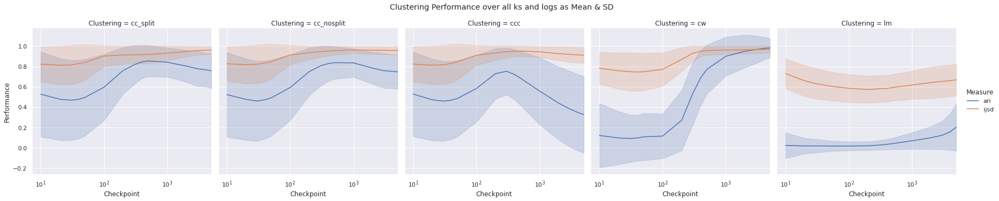

In [27]:
rp = sns.relplot(data=df_clustering_all,
    x='Checkpoint', y='Performance', hue='Measure', col='Clustering', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.85)
rp.fig.suptitle('Clustering Performance over all ks and logs as Mean & SD')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])

In [29]:
df_clustering = pd.melt(df, id_vars=['Checkpoint', 'Clustering', 'k'], value_vars=['ari', 'ijsd'], var_name='Measure', value_name='Performance')
df_clustering.head()

,Checkpoint,Clustering,k,Measure,Performance
0,20,cc_split,1,ari,0.000000
1,1000,cc_split,20,ari,0.753328
2,300,cc_split,3,ari,0.992687
3,2000,cc_split,20,ari,0.680026
4,3000,cc_split,3,ari,0.633105


In [31]:
rp = sns.relplot(data=df_clustering,
    x='Checkpoint', y='Performance', hue='Measure', col='k', row='Clustering', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.95)
rp.fig.suptitle('Clustering Performance over all logs as Mean & SD')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])

ValueError: Could not interpret value `Performance` for parameter `y`

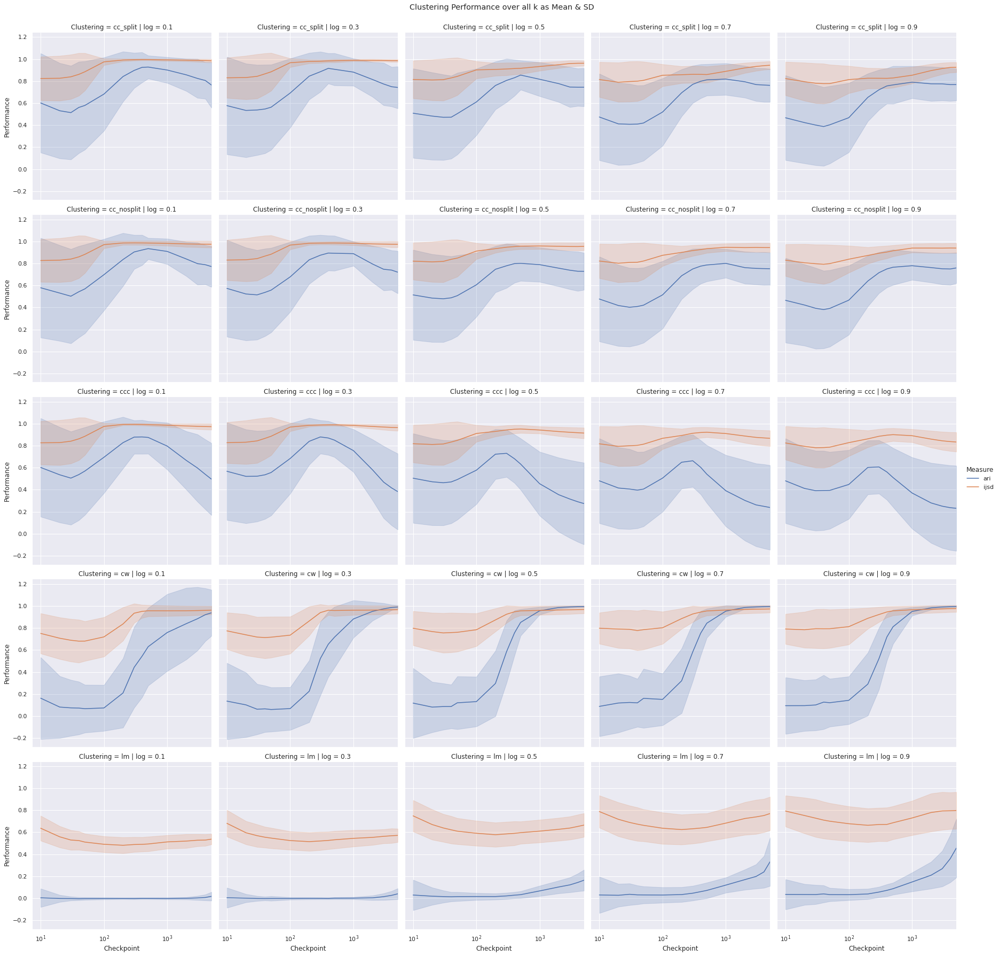

In [26]:
df_clustering = pd.melt(df, id_vars=['Checkpoint', 'Clustering', 'log'], value_vars=['ari', 'ijsd'], var_name='Measure', value_name='Performance')
rp = sns.relplot(data=df_clustering,
    x='Checkpoint', y='Performance', hue='Measure', col='log', row='Clustering', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.95)
rp.fig.suptitle('Clustering Performance over all k as Mean & SD')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])

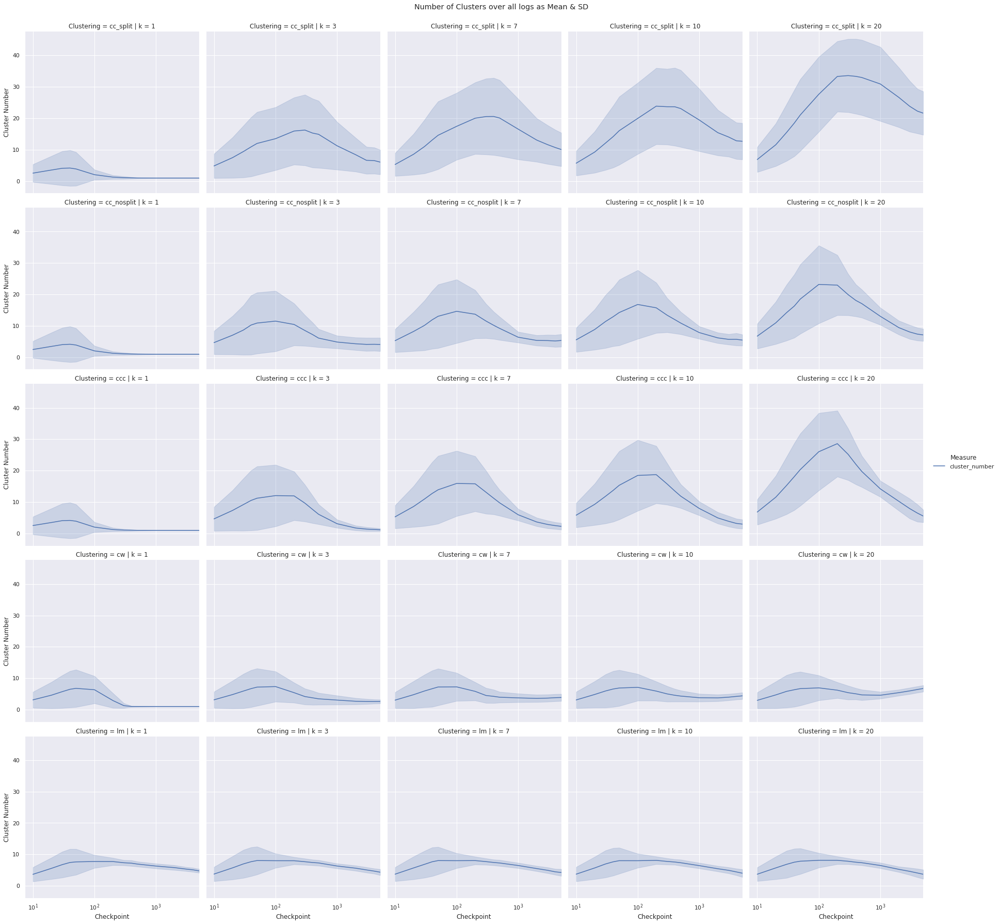

In [28]:
df_clustering = pd.melt(df, id_vars=['Checkpoint', 'Clustering', 'k'], value_vars=['cluster_number'], var_name='Measure', value_name='Cluster Number')
rp = sns.relplot(data=df_clustering,
    x='Checkpoint', y='Cluster Number', hue='Measure', col='k', row='Clustering', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.95)
rp.fig.suptitle('Number of Clusters over all logs as Mean & SD')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])

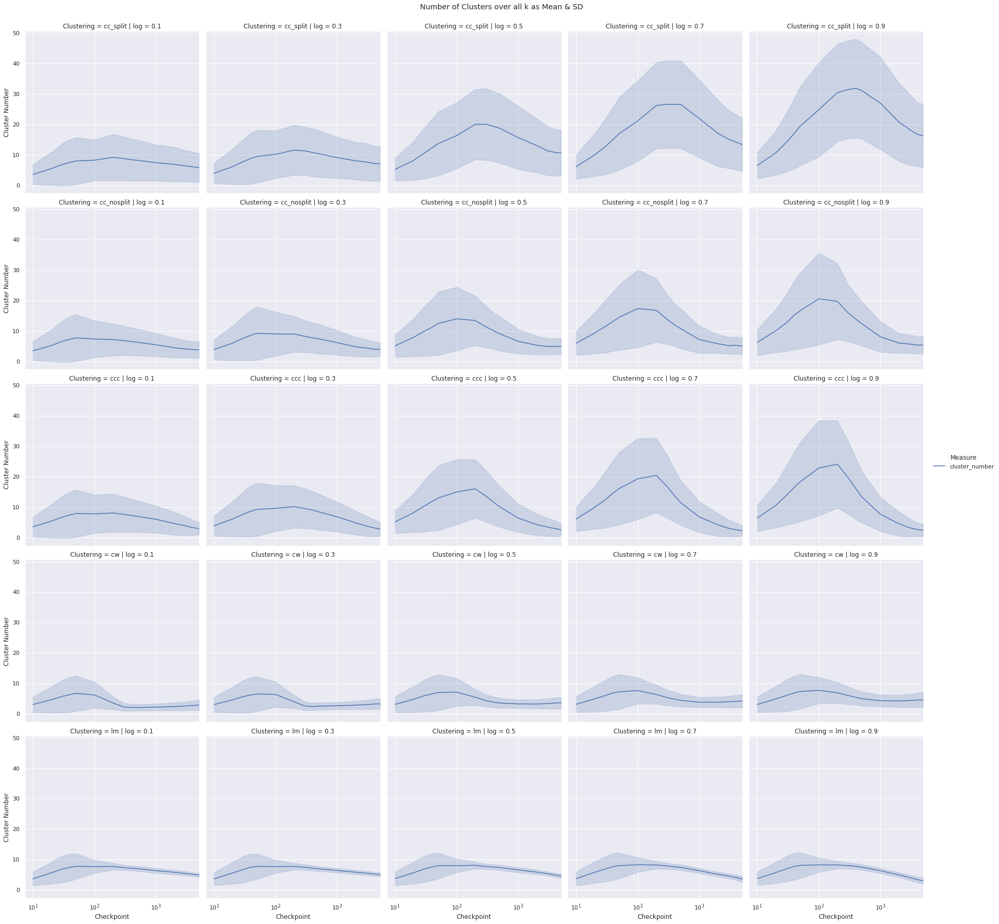

In [30]:
df_clustering = pd.melt(df, id_vars=['Checkpoint', 'Clustering', 'log'], value_vars=['cluster_number'], var_name='Measure', value_name='Cluster Number')
rp = sns.relplot(data=df_clustering,
    x='Checkpoint', y='Cluster Number', hue='Measure', col='log', row='Clustering', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.95)
rp.fig.suptitle('Number of Clusters over all k as Mean & SD')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])

In [ ]:
df_sampling_k_log = pd.melt(df, id_vars=['Checkpoint', 'Clustering', 'log', 'k'], value_vars=['ari', 'ijsd'], var_name='Measure', value_name='Performance')
df_sampling_k_log.head()

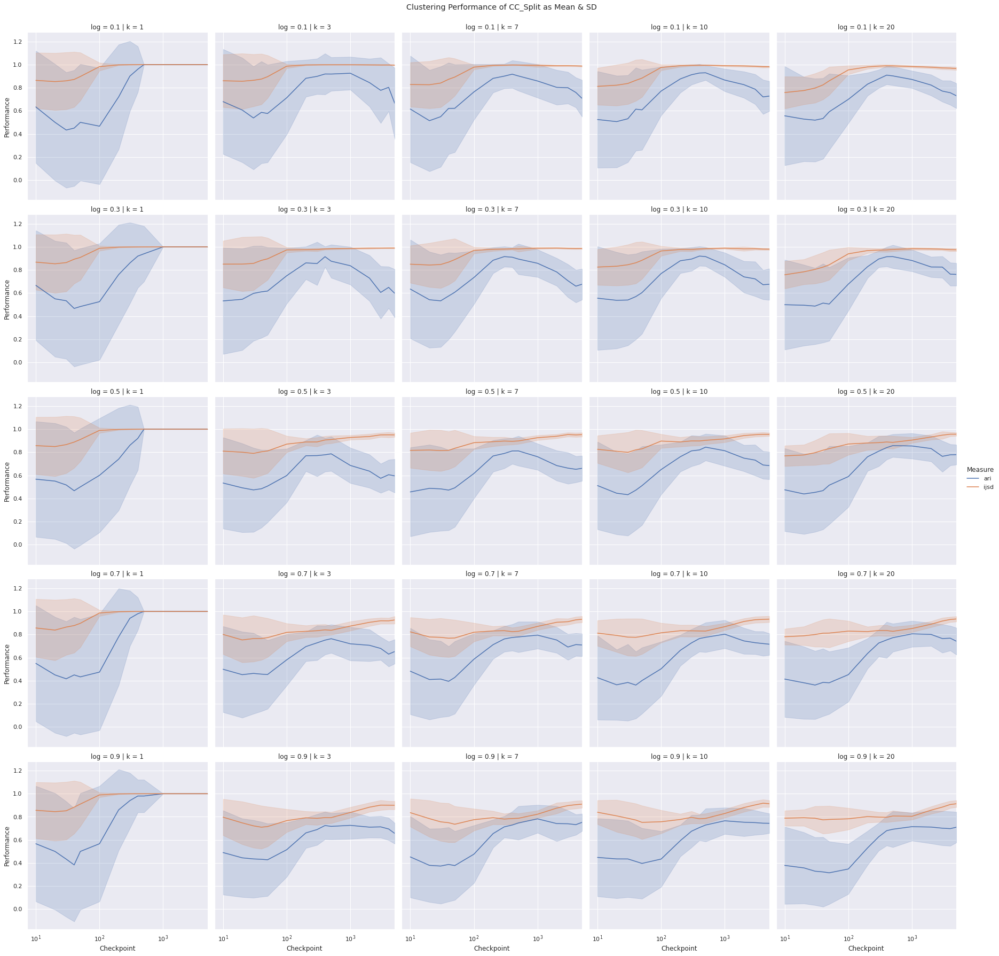

In [11]:
rp = sns.relplot(data=df_sampling_k_log.query('Clustering == "cc_split"'),
    x='Checkpoint', y='Performance', hue='Measure', col='k', row='log', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.95)
rp.fig.suptitle('Clustering Performance of CC_Split as Mean & SD')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])

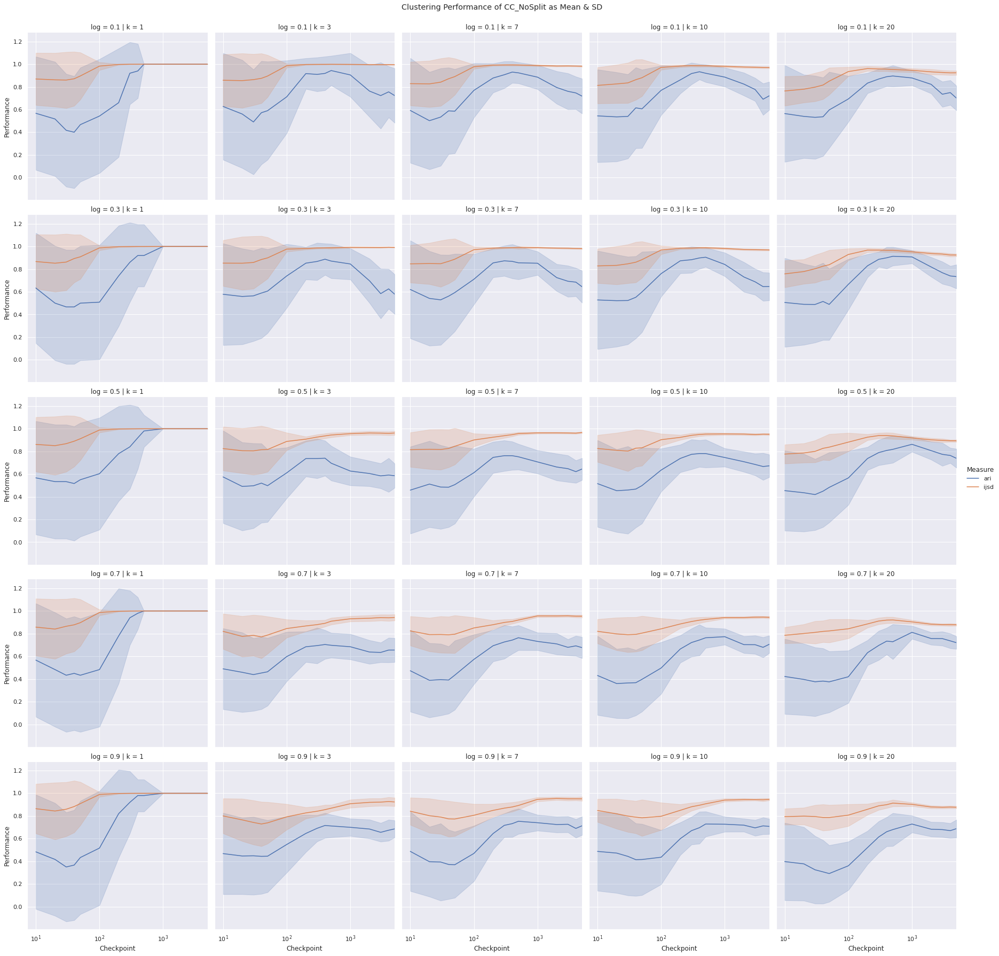

In [12]:
rp = sns.relplot(data=df_sampling_k_log.query('Clustering == "cc_nosplit"'),
    x='Checkpoint', y='Performance', hue='Measure', col='k', row='log', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.95)
rp.fig.suptitle('Clustering Performance of CC_NoSplit as Mean & SD')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])

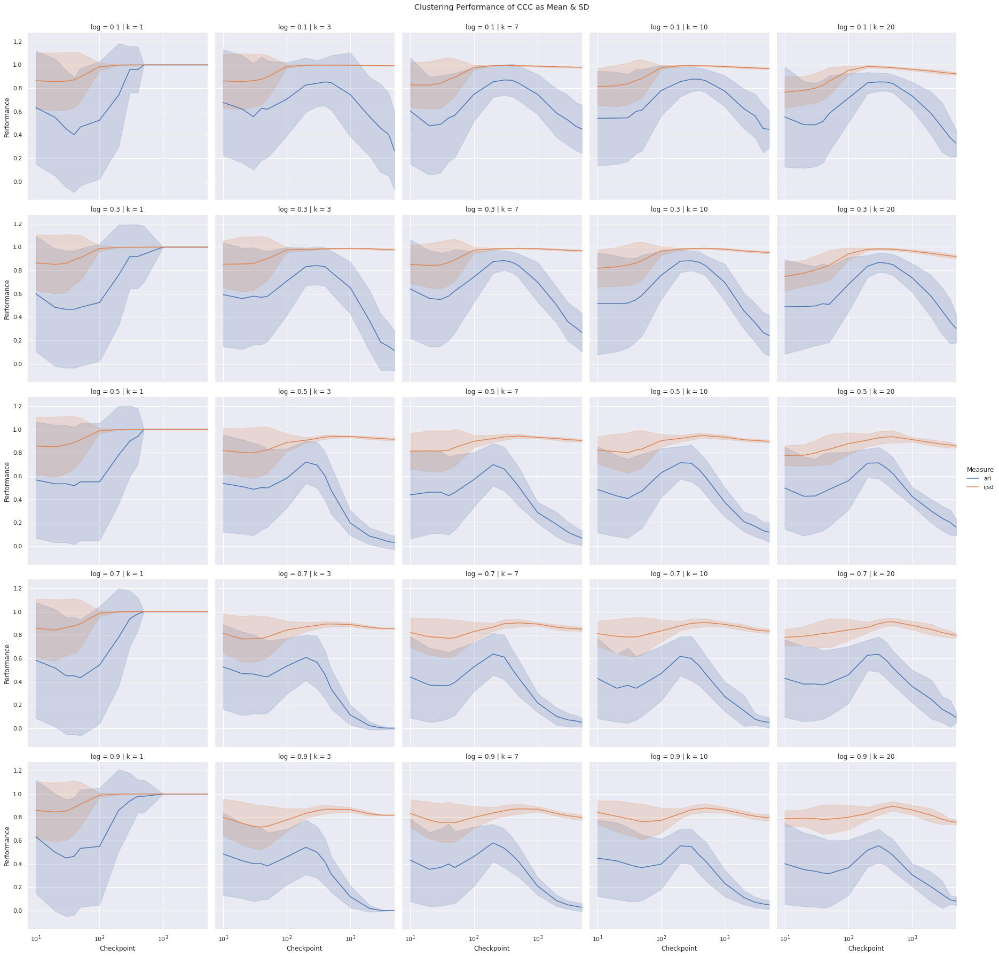

In [13]:
rp = sns.relplot(data=df_sampling_k_log.query('Clustering == "ccc"'),
    x='Checkpoint', y='Performance', hue='Measure', col='k', row='log', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.95)
rp.fig.suptitle('Clustering Performance of CCC as Mean & SD')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])

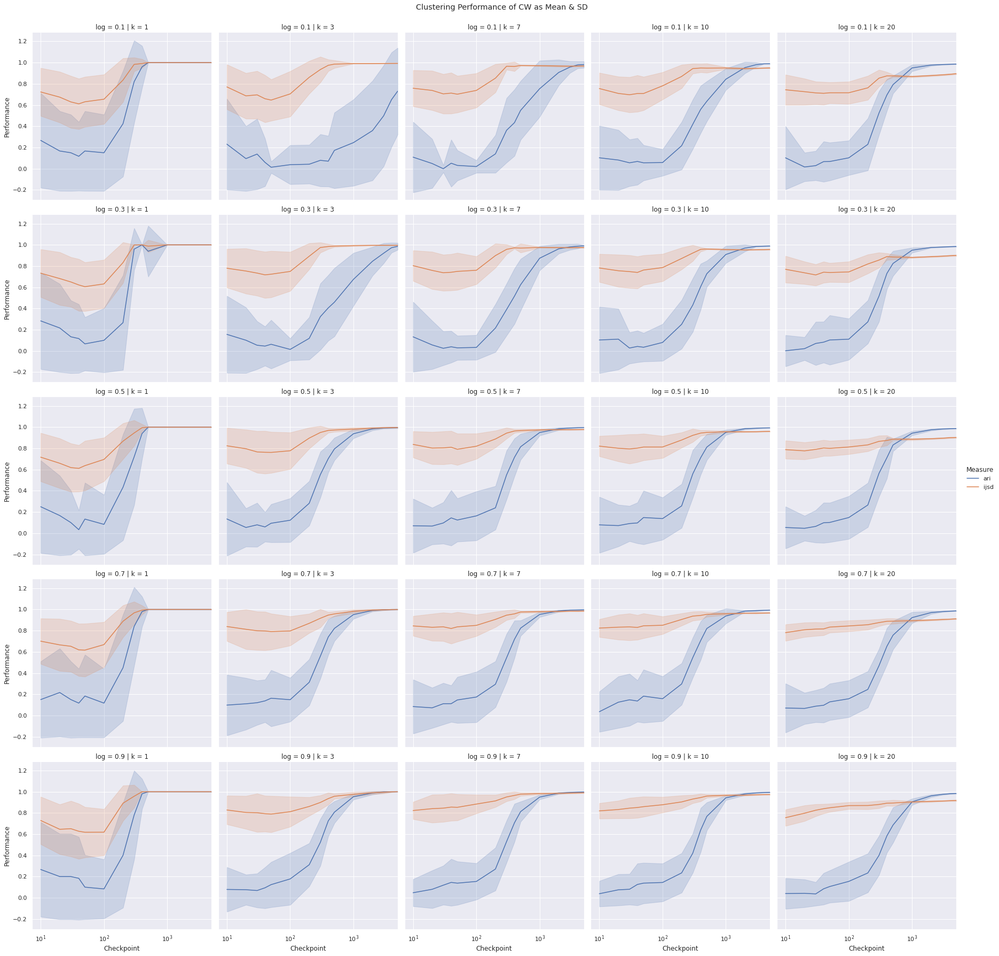

In [14]:
rp = sns.relplot(data=df_sampling_k_log.query('Clustering == "cw"'),
    x='Checkpoint', y='Performance', hue='Measure', col='k', row='log', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.95)
rp.fig.suptitle('Clustering Performance of CW as Mean & SD')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])

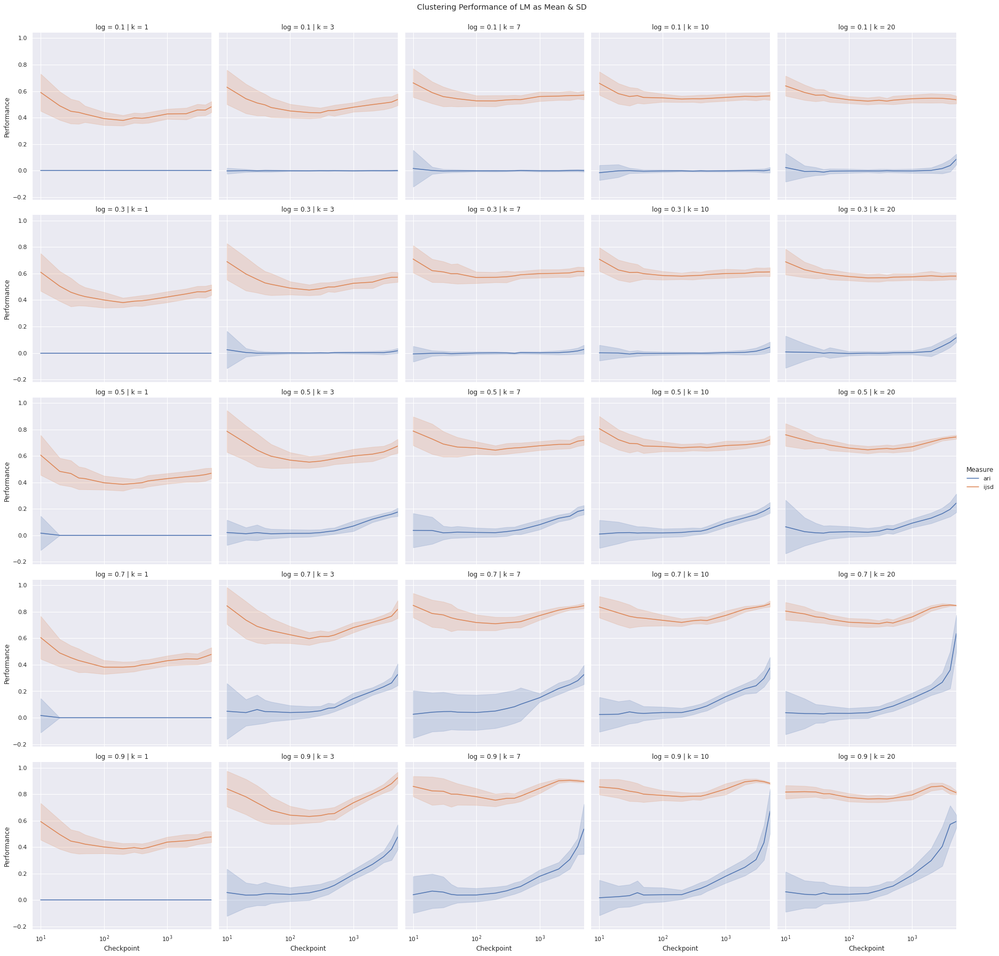

In [15]:
rp = sns.relplot(data=df_sampling_k_log.query('Clustering == "lm"'),
    x='Checkpoint', y='Performance', hue='Measure', col='k', row='log', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.95)
rp.fig.suptitle('Clustering Performance of LM as Mean & SD')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])

In [16]:
df_sampling = pd.melt(df, id_vars=['Checkpoint', 'Clustering', 'log', 'k'], value_vars=['ari'], var_name='Measure', value_name='Performance')
df_sampling.head()

,Checkpoint,Clustering,log,k,Measure,Performance
0,10,cw,0.3,3,ari,1.000000
1,20,cw,0.3,3,ari,1.000000
2,30,cw,0.3,3,ari,0.000000
3,40,cw,0.3,3,ari,-0.061798
4,50,cw,0.3,3,ari,-0.034217


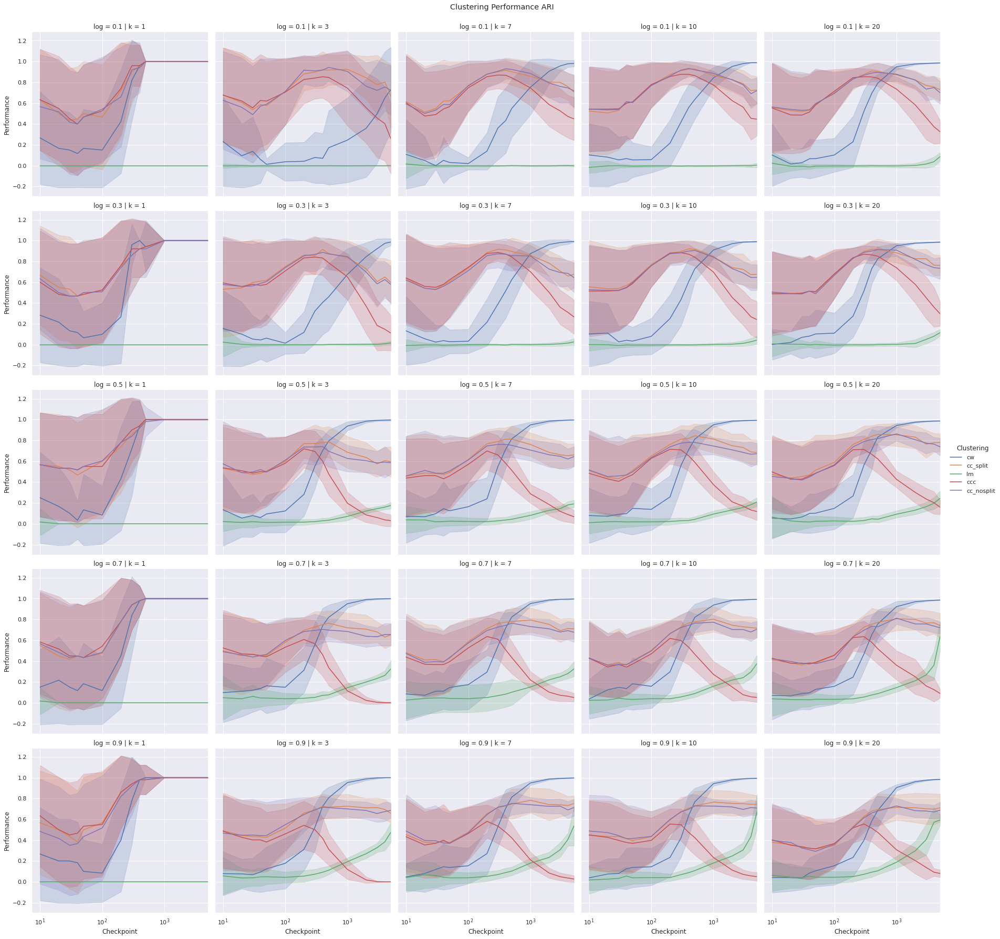

In [17]:
rp = sns.relplot(data=df_sampling,
    x='Checkpoint', y='Performance', hue='Clustering', col='k', row='log', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.95)
rp.fig.suptitle('Clustering Performance ARI')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])

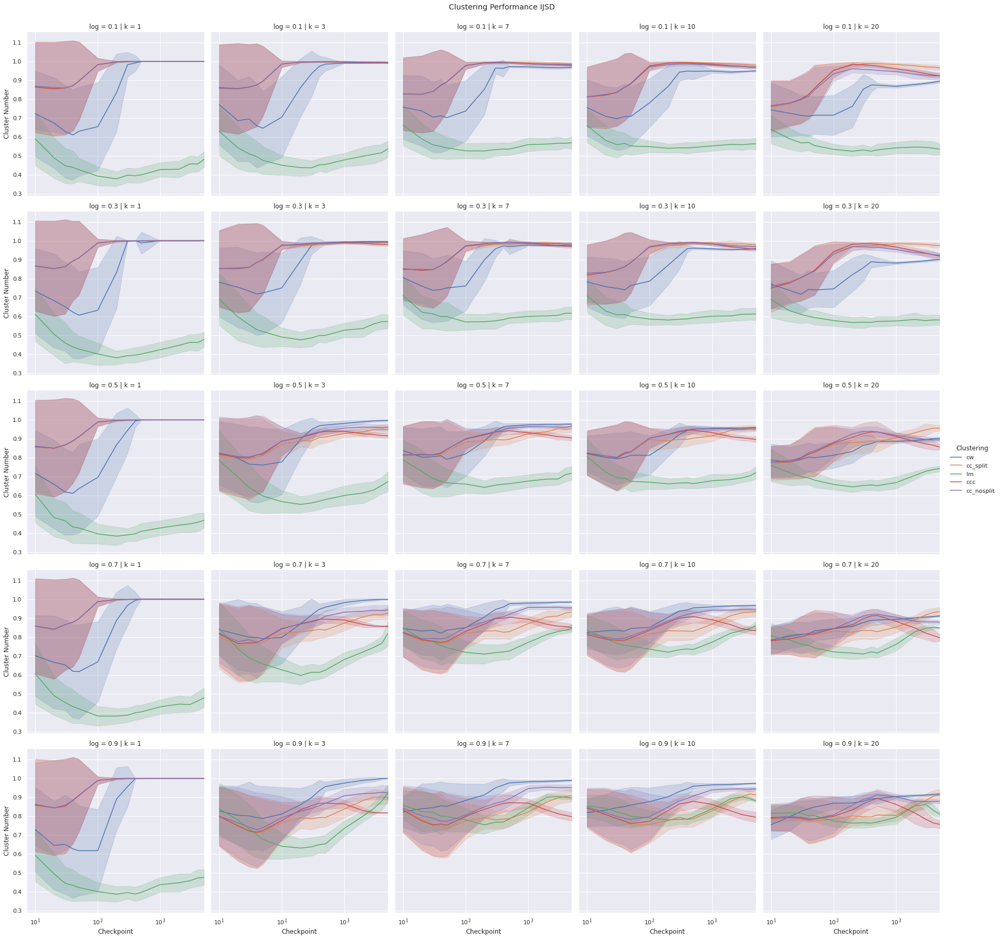

In [18]:
df_sampling = pd.melt(df, id_vars=['Checkpoint', 'Clustering', 'log', 'k'], value_vars=['ijsd'], var_name='Measure', value_name='Cluster Number')
rp = sns.relplot(data=df_sampling,
    x='Checkpoint', y='Cluster Number', hue='Clustering', col='k', row='log', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.95)
rp.fig.suptitle('Clustering Performance IJSD')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])

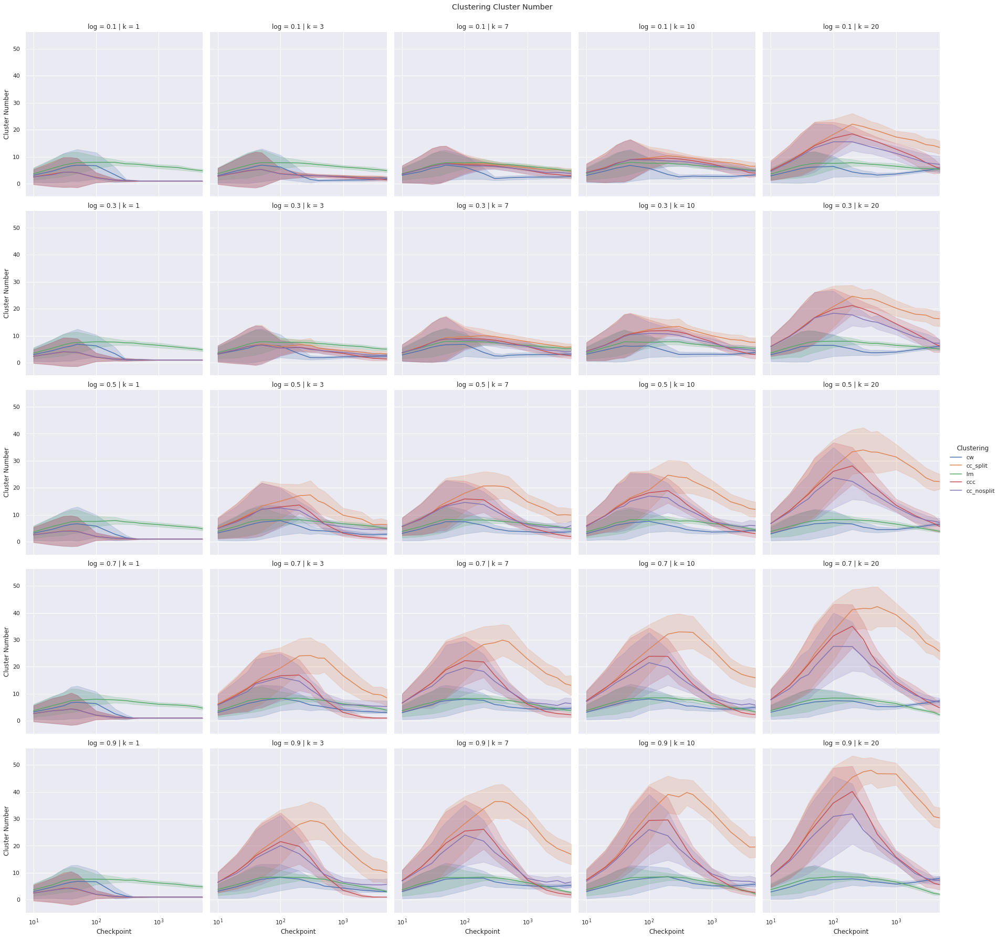

In [19]:
df_sampling = pd.melt(df, id_vars=['Checkpoint', 'Clustering', 'log', 'k'], value_vars=['cluster_number'], var_name='Measure', value_name='Cluster Number')
rp = sns.relplot(data=df_sampling,
    x='Checkpoint', y='Cluster Number', hue='Clustering', col='k', row='log', ci='sd', kind='line')

rp.fig.subplots_adjust(top=0.95)
rp.fig.suptitle('Clustering Cluster Number')
rp.set(xscale='log')
rp.set(xlim=[0, 5000])